In [1]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

from sklearn.datasets import load_files       
from keras.utils import np_utils
from keras.preprocessing import image  

from glob import glob

from tqdm import tqdm

Using TensorFlow backend.


In [2]:
# define function to load train, test, and validation datasets
def load_dataset(path):
    data = load_files(path)
    files = np.array(data['filenames'])
    targets = np_utils.to_categorical(np.array(data['target']), 3)
    return files, targets

# load train, test, and validation datasets
train_files, train_targets = load_dataset('data/train')
valid_files, valid_targets = load_dataset('data/valid')
test_files, test_targets = load_dataset('data/test')

# load ordered list of dog names
anomaly_type = [item[:-1] for item in glob('data/train/*/')]

# print statistics about the dataset
print('There are %d total anomaly categories.' % len(anomaly_type))
print('There are %s total anomaly images.\n' % str(len(train_files) + len(valid_files) + len(test_files)))
print('There are %d training anomaly images.' % len(train_files))
print('There are %d validation anomaly images.' % len(valid_files))
print('There are %d test anomaly images.'% len(test_files))

There are 3 total anomaly categories.
There are 2750 total anomaly images.

There are 2000 training anomaly images.
There are 150 validation anomaly images.
There are 600 test anomaly images.


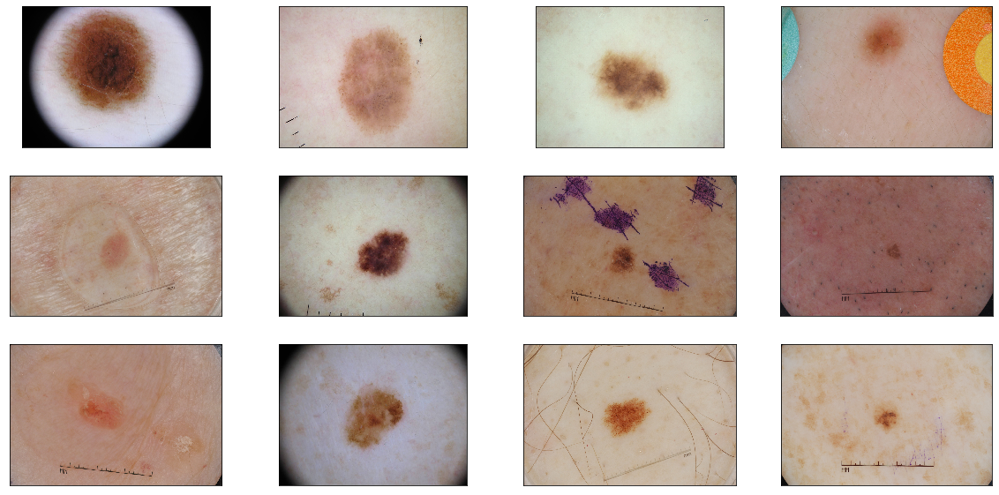

In [2]:
def visualize_img(img_path, ax):
    img = cv2.imread(img_path)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
fig = plt.figure(figsize=(20, 10))
for i in range(12):
    ax = fig.add_subplot(3, 4, i + 1, xticks=[], yticks=[])
    visualize_img(train_files[i], ax)

In [6]:
def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(224, 224))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

In [ ]:
train_tensors = paths_to_tensor(train_files).astype('float32')/255
valid_tensors = paths_to_tensor(valid_files).astype('float32')/255
test_tensors = paths_to_tensor(test_files).astype('float32')/255

 87%|████████████████████████████████████████████████████████████████████          | 1746/2000 [02:56<00:26,  9.45it/s]

In [ ]:
from keras.applications.vgg16 import VGG16
model = VGG16(weights= None, include_top=True, classes= 3, input_shape=(224, 224, 3))


In [ ]:
from keras.preprocessing.image import ImageDataGenerator

# create and configure augmented image generator
datagen_train = ImageDataGenerator(width_shift_range=0.1,  
                                   height_shift_range=0.1, 
                                   horizontal_flip=True,
                                   featurewise_center=True, 
                                   zoom_range=[0.5,1.0],
                                   brightness_range=[0.2,1.0]
                                  ) 

# fit augmented image generator on data
datagen_train.fit(train_tensors)

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import ModelCheckpoint  

checkpointer = ModelCheckpoint(filepath='saved_models/weights.hdf5', 
                               verbose=1, save_best_only=True)

model.fit(datagen_train.flow(train_tensors, train_targets),
          validation_data=(valid_tensors, valid_targets),
          epochs=30, callbacks=[checkpointer], verbose=1)

In [ ]:
model.load_weights('saved_models/weights.hdf5')

In [ ]:
predictions = model.predict(test_tensors, verbose = 1)

In [ ]:
predictions

In [ ]:
targets = np.array([np.argmax(target) for target in test_targets]).reshape(600,1)

In [ ]:
preds = np.array([np.argmax(pred) for pred in predictions])

In [ ]:
np.sum(preds == targets.T)/len(test_targets)

In [ ]:
newarr = np.append(arr = np.round(predictions, 3), values = targets, axis = 1)

In [16]:
df = pd.DataFrame(newarr)

In [17]:
df.describe()

,0,1,2,3
count,600.000,600.00000,600.000000,600.000000
mean,0.188,0.56716,0.244985,0.955000
std,0.000,0.00066,0.000662,0.586129
min,0.188,0.56600,0.242000,0.000000
25%,0.188,0.56700,0.245000,1.000000
50%,0.188,0.56700,0.245000,1.000000
75%,0.188,0.56800,0.245000,1.000000
max,0.188,0.57000,0.246000,2.000000


In [18]:
plt.figure(figsize=(20, 5))
for i, col in enumerate(df.columns[:3]):
    plt.subplot(1, 4, i + 1)
    plt.subplots_adjust(wspace = 0.2, hspace = 0.4)
    sns.distplot(df[col],20)

NameError: name 'plt' is not defined

In [19]:
melanoma = df[(df[3]==0) & (df.drop(3, axis = 1).idxmax(axis=1)==0)]

In [20]:
melanoma

,0,1,2,3


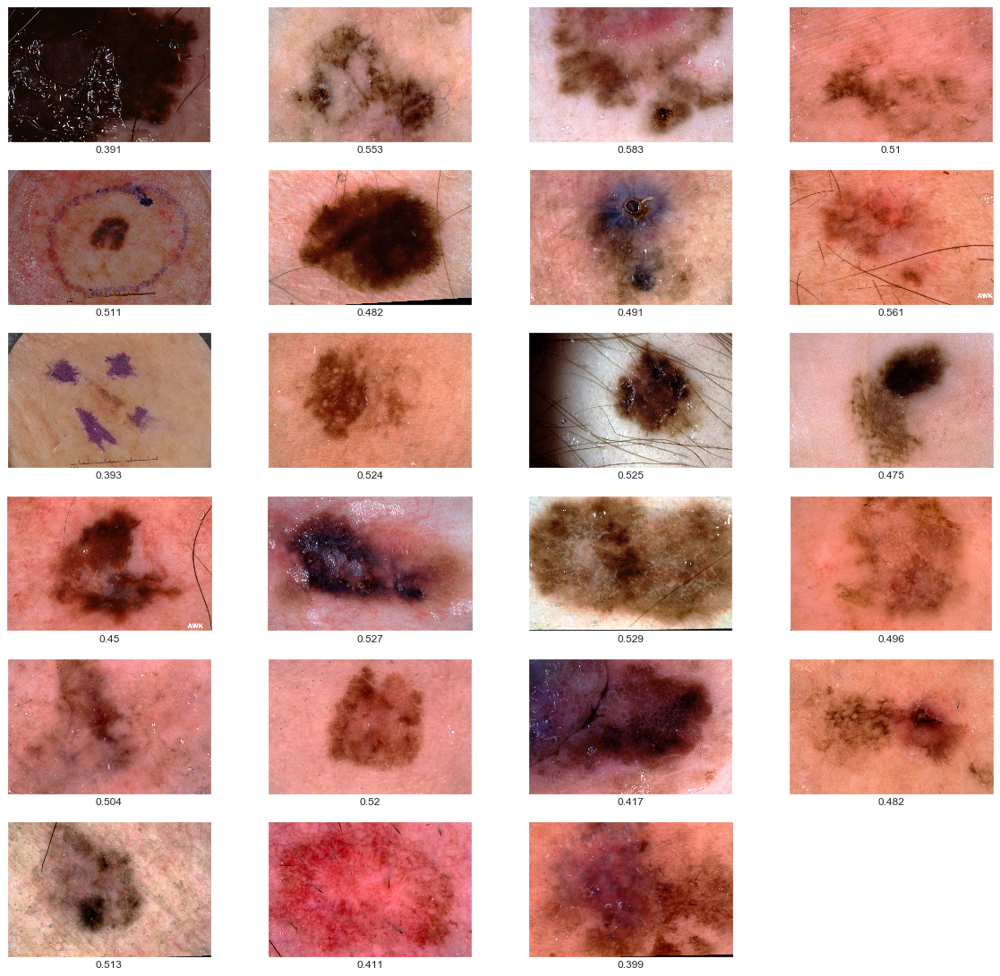

In [55]:
fig = plt.figure(figsize=(20, 100))
for n, i in enumerate(melanoma.index):
    ax = fig.add_subplot(30, 4, n + 1, xticks=[], yticks=[])
    plt.xlabel(round(melanoma[0][i],3))
    visualize_img(test_files[i], ax)

In [49]:
non_melanoma = df[(df[3]==0) & (df.drop(3, axis = 1).idxmax(axis=1)!=0)]

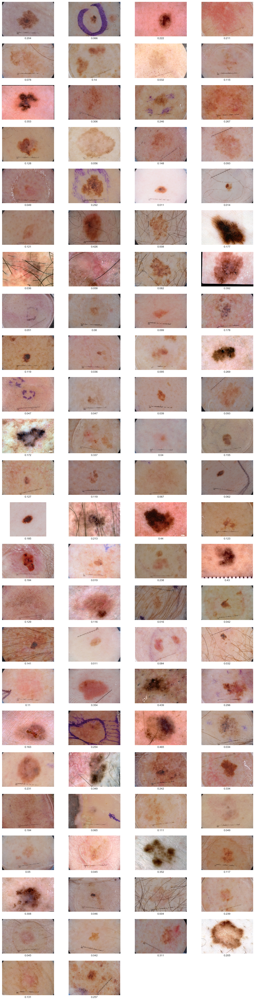

In [57]:
fig = plt.figure(figsize=(20, 100))
for n, i in enumerate(non_melanoma.index):
    ax = fig.add_subplot(30, 4, n + 1, xticks=[], yticks=[])
    plt.xlabel(round(non_melanoma[0][i],3))
    visualize_img(test_files[i], ax)

In [28]:
from sklearn.metrics import confusion_matrix

In [29]:
confusion_matrix(targets, preds)

array([[  0,  85,  32],
       [  0, 363,  30],
       [  0,  29,  61]], dtype=int64)